In [38]:
import numpy as np
import pandas as pd
import plotly.express as px

import os
# import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from wordcloud import WordCloud, STOPWORDS

#Text Color
from termcolor import colored

#Data Preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

#NLP
from sklearn.feature_extraction.text import CountVectorizer

#WordCloud
from wordcloud import WordCloud, STOPWORDS

#Text Processing
import re
import nltk
nltk.download('popular')

#Language Detection
!pip install langdetect
import langdetect

#Sentiment
from textblob import TextBlob

#ner
import spacy

#Vectorizer
from sklearn import feature_extraction, manifold

#Word Embedding
import gensim.downloader as gensim_api

#Topic Modeling
import gensim

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

In [76]:
! pip install fsspec

     |████████████████████████████████| 132 kB 5.0 MB/s 


In [78]:
#!pip install hvplot
import hvplot.pandas  # custom install

from glob import glob

#from bq_helper import BigQueryHelper
from dask import bag, diagnostics 
from urllib import request

import missingno as msno

In [39]:
from PIL import Image

In [40]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
sample = pd.read_csv('sample_submission.csv')

In [41]:
train.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


In [42]:
test.head()

,posting_id,image,image_phash,title
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng


In [43]:
sample.head()

,posting_id,matches
0,test_2255846744,test_2255846744
1,test_3588702337,test_3588702337
2,test_4015706929,test_4015706929


In [44]:
#Image Folder Paths
train_jpg_directory = 'train_images'
test_jpg_directory = 'test_images'

In [45]:
def getImagePaths(path):
    """
    Function to Combine Directory Path with individual Image Paths
    
    parameters: path(string) - Path of directory
    returns: image_names(string) - Full Image Path
    """
    image_names = []
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

In [46]:
#Get complete image paths for train and test datasets
train_images_path = getImagePaths(train_jpg_directory)
test_images_path = getImagePaths(test_jpg_directory)

In [47]:
print(f"Training Dataset Shape: {colored(train.shape, 'red')}")
print(f"Test Dataset Shape: {colored(test.shape, 'red')}")

Training Dataset Shape: (34250, 5)
Test Dataset Shape: (3, 4)


**Column Wise Unique Values**

In [48]:
for col in train.columns:
    print(col + ":" + colored(str(len(train[col].unique())), 'red'))

posting_id:34250
image:32412
image_phash:28735
title:33117
label_group:11014


In [49]:
def display_multiple_img(images_paths, rows, cols):
    """
    Function to Display Images from Dataset.
    
    parameters: images_path(string) - Paths of Images to be displayed
                rows(int) - No. of Rows in Output
                cols(int) - No. of Columns in Output
    """
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    for ind,image_path in enumerate(images_paths):
        image=cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()

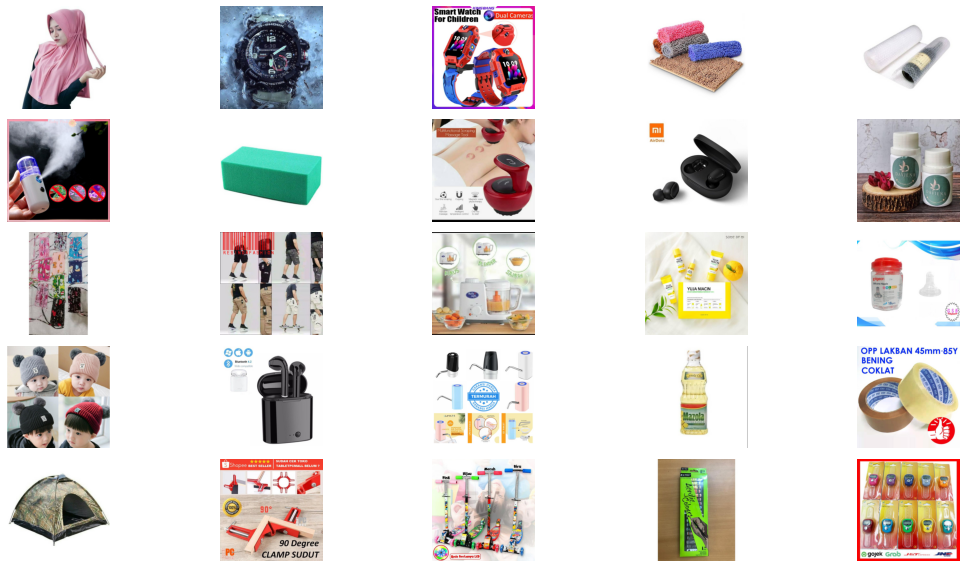

In [50]:
# How do the images look like
display_multiple_img(train_images_path[100:150], 5, 5)

## **Titles EDA**

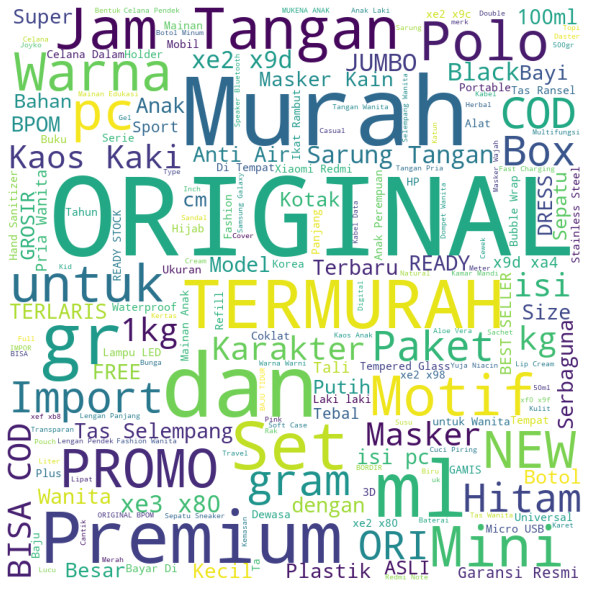

In [51]:
stopwords = set(STOPWORDS) 
wordcloud = WordCloud(width = 800, 
                      height = 800,
                      background_color ='white',
                      min_font_size = 10,
                      stopwords = stopwords,).generate(' '.join(train['title'])) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show() 

### **Basic NLP**

In [52]:
def preprocess_text(text, flg_stemm=False, flg_lemm=True):

    lst_stopwords = nltk.corpus.stopwords.words("english")
    
    ## clean (convert to lowercase and remove punctuations and characters and then strip)
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
            
    ## Tokenize (convert from string to list)
    lst_text = text.split()
    ## remove Stopwords
    if lst_stopwords is not None:
        lst_text = [word for word in lst_text if word not in 
                    lst_stopwords]
                
    ## Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        lst_text = [ps.stem(word) for word in lst_text]
                
    ## Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()    
        lst_text = [lem.lemmatize(word) for word in lst_text]
            
    ## back to string from list
    text = " ".join(lst_text)
    return text

In [53]:
#Clean Address
train["clean_title"] = train["title"].apply(lambda x: preprocess_text(x, flg_stemm=False, flg_lemm=True, ))

#Length of Title
train['clean_title_len'] = train['clean_title'].apply(lambda x: len(x))

#Word Count
train['clean_title_word_count'] =train["clean_title"].apply(lambda x: len(str(x).split(" ")))

#Character Count
train['clean_title_char_count'] = train["clean_title"].apply(lambda x: sum(len(word) for word in str(x).split(" ")))

#Average Word Length
train['clean_title_avg_word_length'] = train['clean_title_char_count'] / train['clean_title_word_count']

### **Distribution Plots**

In [54]:
def plot_distribution(x, title):

    fig = px.histogram(
    train, 
    x = x,
    width = 800,
    height = 500,
    title = title
    )
    
    fig.show()

In [55]:
plot_distribution(x = 'clean_title_len', title = 'Title Length Distribution')

In [56]:
plot_distribution(x = 'clean_title_word_count', title = 'Word Count Distribution')

In [57]:
plot_distribution(x = 'clean_title_char_count', title = 'Character Count Distribution')

In [58]:
plot_distribution(x = 'clean_title_avg_word_length', title = 'Average Word Length Distribution')

In [59]:
print("No. of Unique Label Groups: ",train.label_group.nunique())

No. of Unique Label Groups:  11014


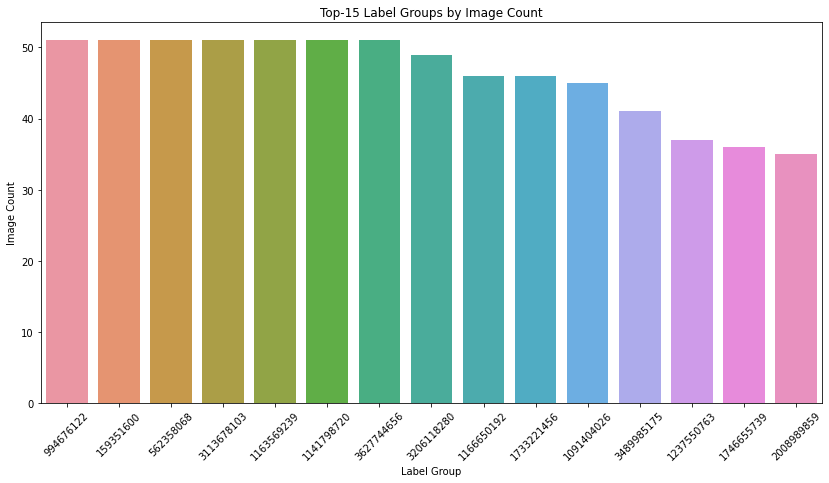

In [60]:
top10_names = train['label_group'].value_counts().index.tolist()[:15]
top10_values = train['label_group'].value_counts().tolist()[:15]

top_10_df = pd.DataFrame(zip(top10_names,top10_values),columns=['Label Group','Image Count'])

plt.figure(figsize=(14, 7))
sns.barplot(x=top_10_df['Label Group'], 
            y=top_10_df['Image Count'], 
            order = top_10_df.sort_values('Image Count',ascending=False)['Label Group'])
plt.xticks(rotation=45)
plt.xlabel("Label Group")
plt.ylabel("Image Count")
plt.title("Top-15 Label Groups by Image Count")
plt.show()



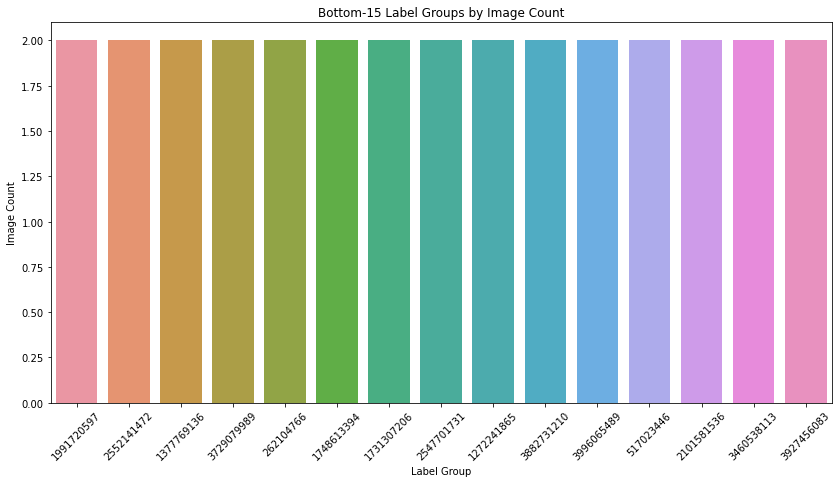

In [61]:
last15_names = train['label_group'].value_counts().index.tolist()[-15:]
last15_values = train['label_group'].value_counts().tolist()[-15:]

last15_df = pd.DataFrame(zip(last15_names,last15_values),columns=['Label Group','Image Count'])

plt.figure(figsize=(14, 7))
sns.barplot(x=last15_df['Label Group'], 
            y=last15_df['Image Count'], 
            order = last15_df.sort_values('Image Count',ascending=False)['Label Group'])
plt.xticks(rotation=45)
plt.xlabel("Label Group")
plt.ylabel("Image Count")
plt.title("Bottom-15 Label Groups by Image Count")
plt.show()



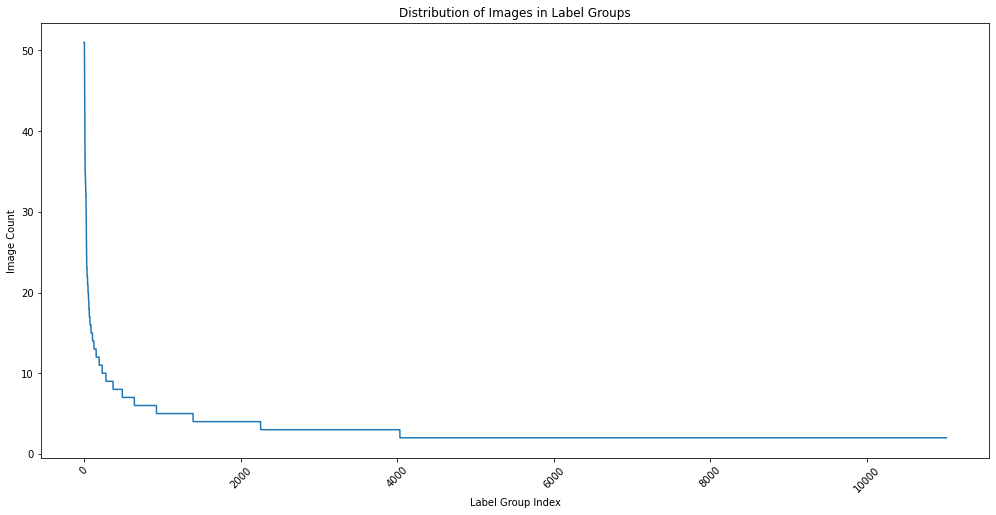

In [62]:
labelnames = train['label_group'].value_counts().index.tolist()
labelvalues = train['label_group'].value_counts().tolist()

label_df = pd.DataFrame(zip(labelnames,labelvalues),columns=['Label Group','Image Count']).sort_values(['Image Count'],ascending=False)

plt.figure(figsize=(17, 8))
sns.lineplot(x=label_df.reset_index().index,
             y=label_df['Image Count'])
plt.xticks(rotation=45)
plt.xlabel("Label Group Index")
plt.ylabel("Image Count")
plt.title("Distribution of Images in Label Groups")
plt.show()


In [63]:
imagecount_df = pd.DataFrame(label_df['Image Count'].value_counts()).reset_index()
imagecount_df.rename(columns = {"index":"Image Count","Image Count":"Number of Label Groups"}).head(10)

,Image Count,Number of Label Groups
0,2,6979
1,3,1779
2,4,862
3,5,468
4,6,282
5,7,154
6,8,118
7,9,91
8,10,48
9,12,39


In [64]:
def path(group,m):
    PATH = "train_images/"
    
    #label
    if m=='l':
        z = train['image'][train['label_group']==group].values
    
    #title
    if m=='t':
        z = train['image'][train['title']==group].values
   
    image_names = []
    for filename in z:
        fullpath = os.path.join(PATH, filename)
        image_names.append(fullpath)
    return image_names

## Looking at 10 Images from the Top 5 Label Groups by Image Count

10 Images from the Top  1  label group are:


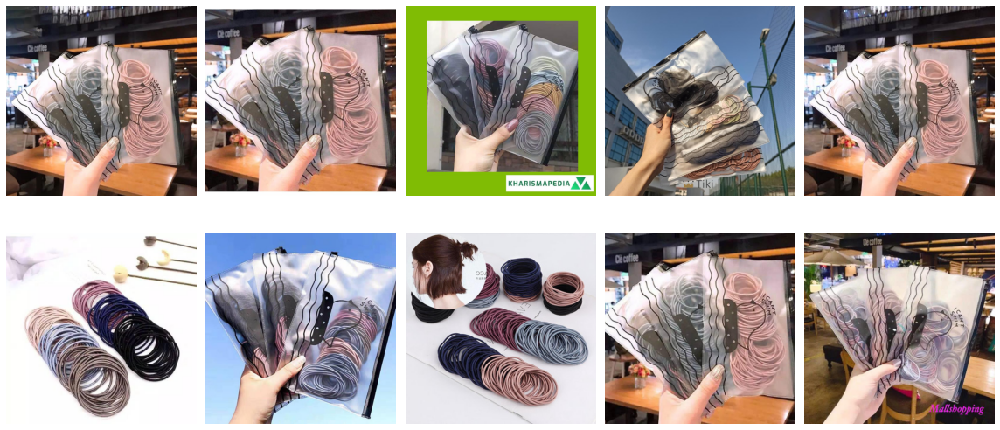

10 Images from the Top  2  label group are:


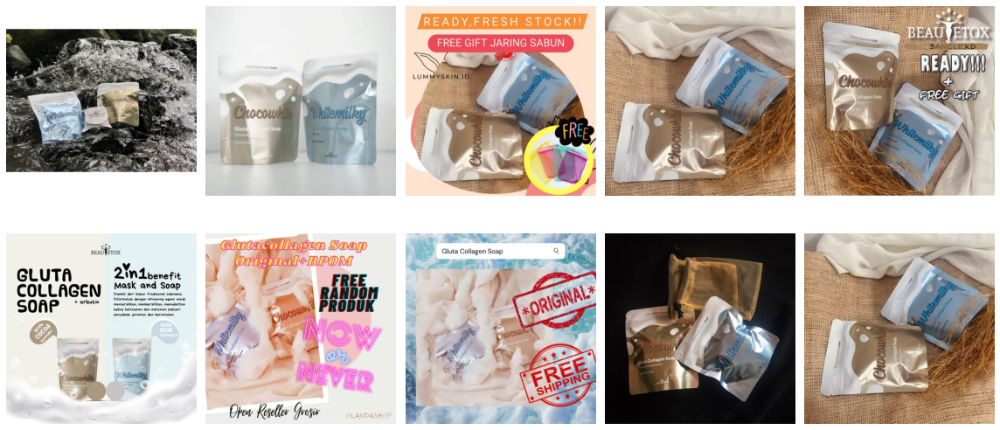

10 Images from the Top  3  label group are:


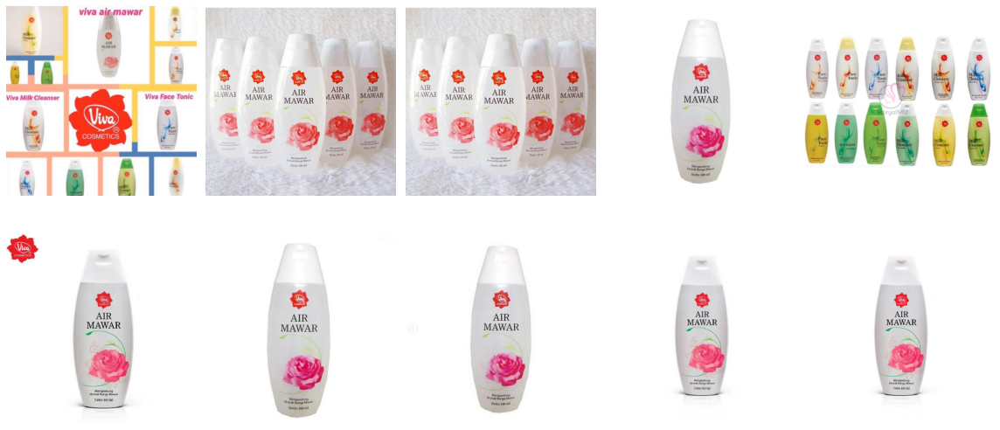

10 Images from the Top  4  label group are:


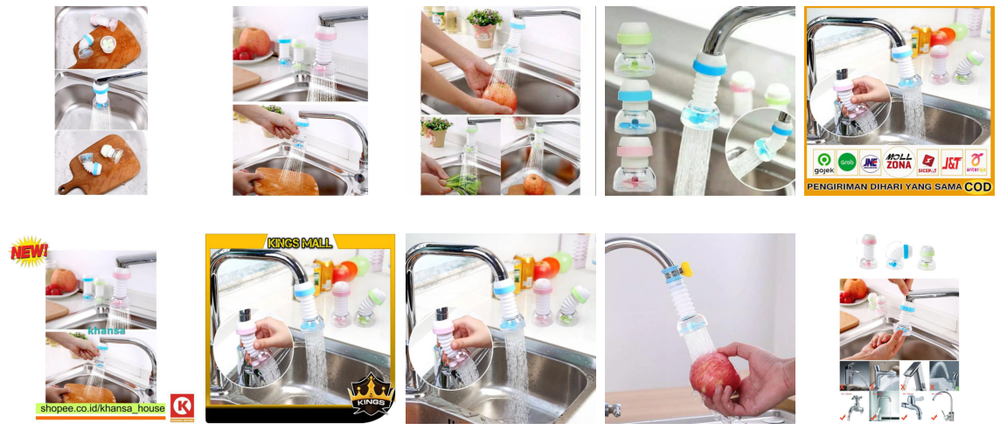

10 Images from the Top  5  label group are:


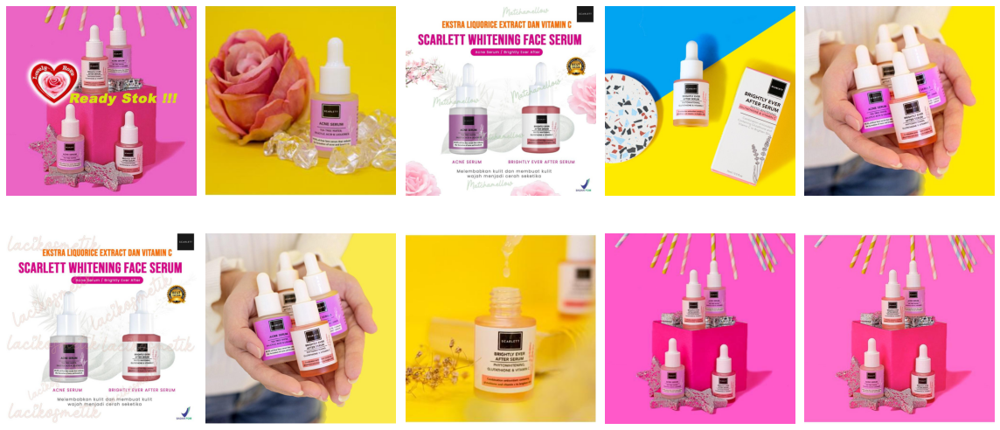

In [65]:

for i in range(5):
    lg = top_10_df['Label Group'][i]
    print("10 Images from the Top ",i+1," label group are:")
    display_multiple_img(path(lg,'l'), 2, 5)

## Looking at All Images from the bottom 5 Label Groups by Image Count

All Images from the Bottom  1  label group are:


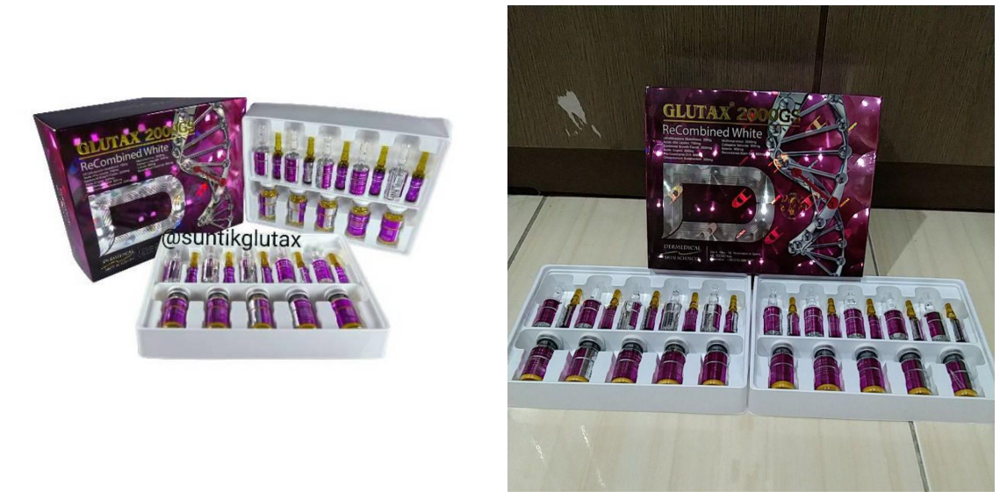

All Images from the Bottom  2  label group are:


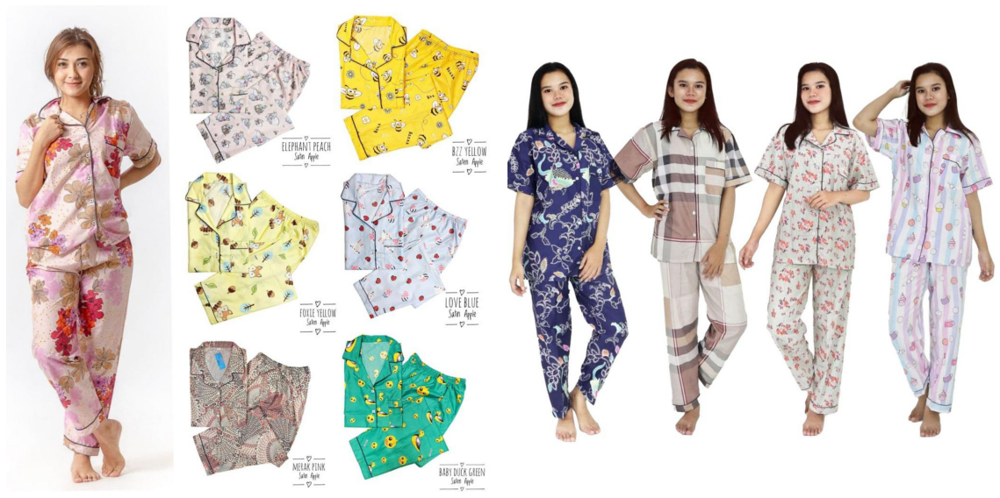

All Images from the Bottom  3  label group are:


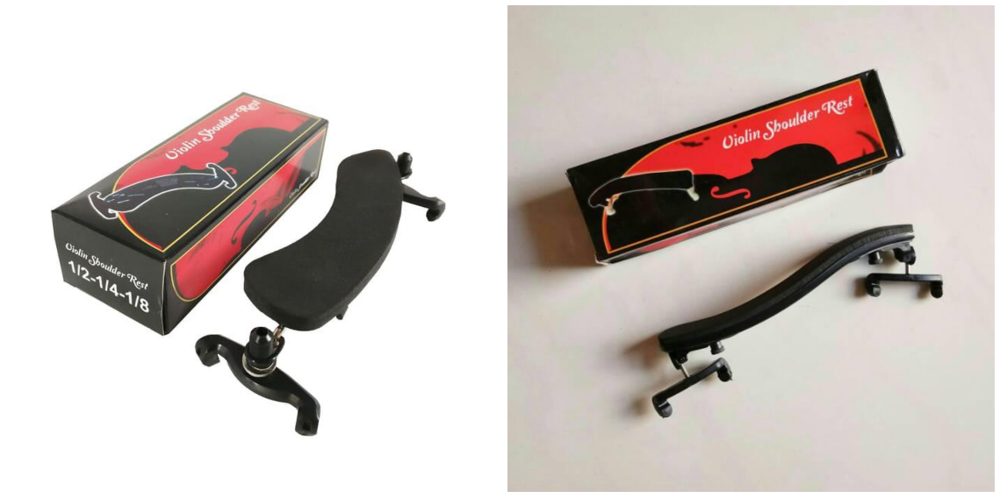

All Images from the Bottom  4  label group are:


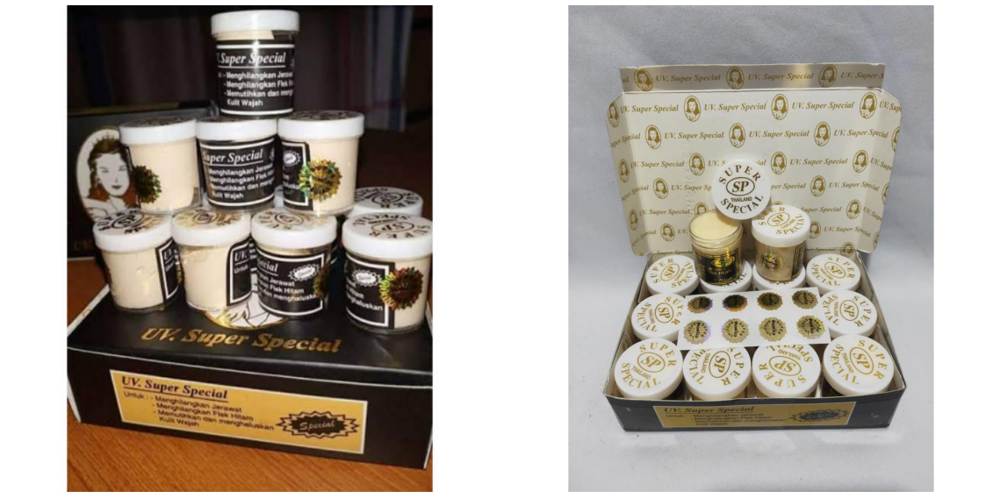

All Images from the Bottom  5  label group are:


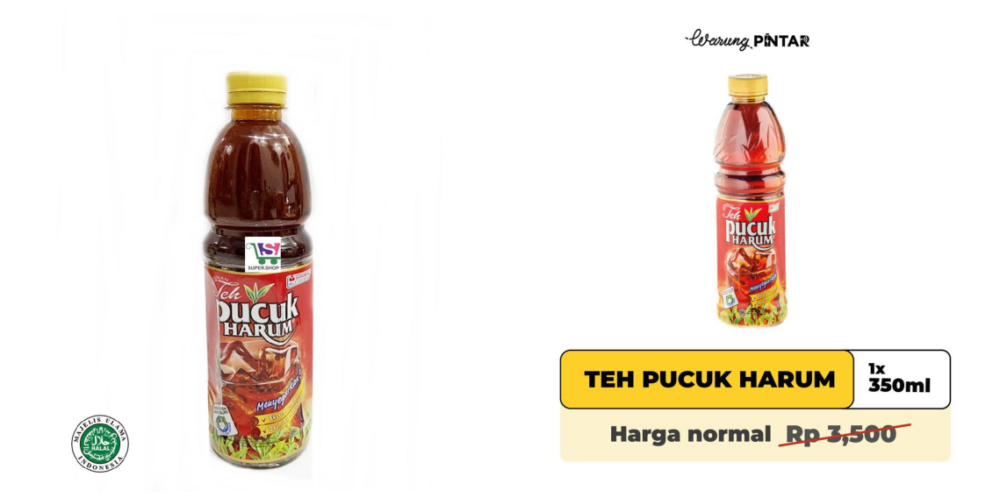

In [66]:
for i in range(5):
    lg = train['label_group'].value_counts().index.tolist()[-5:][i]
    print("All Images from the Bottom ",i+1," label group are:")
    display_multiple_img(path(lg,'l'), 1, 2)

## **Creating Pixel Matrix for K means clustering** <br>
For any image specific classification, clustering, etc. transforms we'll want to collapse spatial dimensions so that we have a matrix of pixels by color channels

In [67]:
first = cv2.imread(train_images_path[3])
dims = np.shape(first)
print(dims)

(1010, 1010, 3)


In [68]:
fpixel_matrix = np.reshape(first, (dims[0] * dims[1], dims[2]))
print(np.shape(fpixel_matrix))

(1020100, 3)


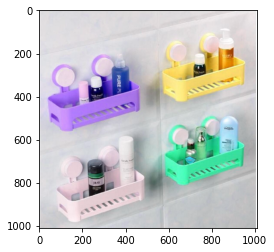

In [69]:
plt.imshow(first)


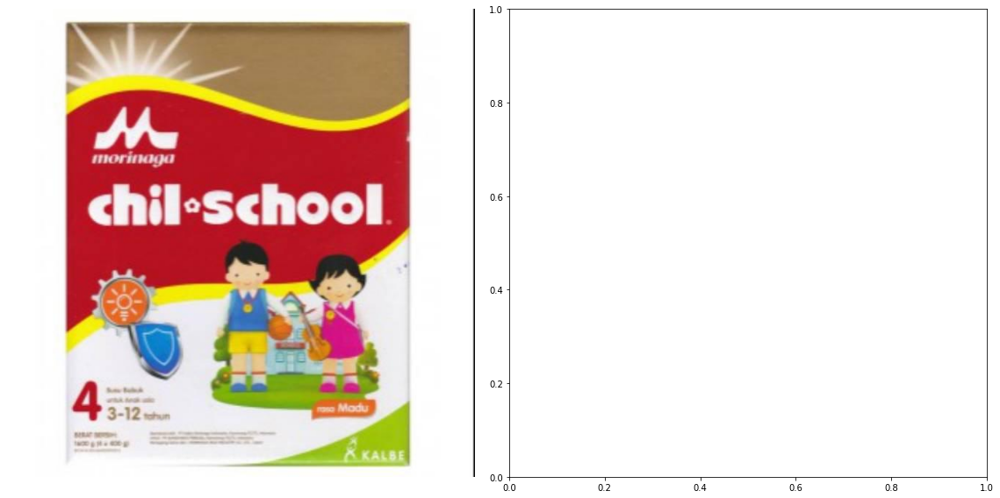

In [70]:
display_multiple_img(train_images_path[0:1], 1, 2)

In [71]:
second = cv2.imread(train_images_path[1])
dims = np.shape(second)
print(dims)

(1024, 1024, 3)


In [72]:
pixel_matrix = np.reshape(second, (dims[0] * dims[1], dims[2]))
print(np.shape(pixel_matrix))

(1048576, 3)


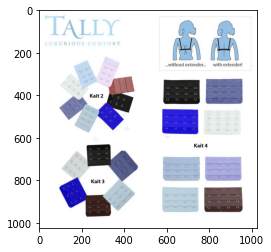

In [73]:
plt.imshow(second)

### **Image Dimension Check**

In [79]:
# get image dimensions
def get_dims(file):
    img = cv2.imread(file)
    h,w = img.shape[:2]
    return h,w

# parallelize
filelist = train_images_path
dimsbag = bag.from_sequence(filelist).map(get_dims)
with diagnostics.ProgressBar():
    dims = dimsbag.compute()
    
dim_df = pd.DataFrame(dims, columns=['height', 'width'])
sizes = dim_df.groupby(['height', 'width']).size().reset_index().rename(columns={0:'count'})
sizes.hvplot.scatter(x='height', y='width', size='count', xlim=(0,1200), ylim=(0,1200), grid=True, xticks=2, 
        yticks=2, height=500, width=600).options(scaling_factor=0.1, line_alpha=1, fill_alpha=0)

[########################################] | 100% Completed |  3min 44.1s


:Scatter   [height]   (width,count)

### **K MEANS CLUSTERING**

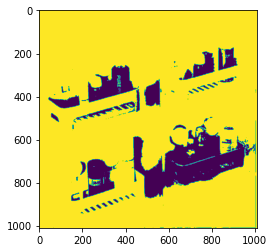

In [80]:
# simple k means clustering and application on the first image
from sklearn import cluster

kmeans = cluster.KMeans(2)
clustered = kmeans.fit_predict(fpixel_matrix)

dims = np.shape(first)
clustered_img = np.reshape(clustered, (dims[0], dims[1]))
plt.imshow(clustered_img)

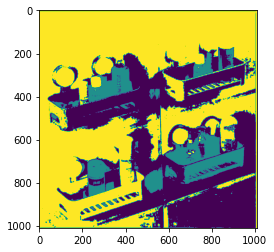

In [81]:
kmeans = cluster.KMeans(3)
clustered = kmeans.fit_predict(fpixel_matrix)

dims = np.shape(first)
clustered_img = np.reshape(clustered, (dims[0], dims[1]))
plt.imshow(clustered_img)

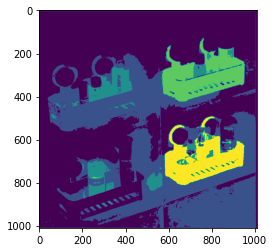

In [82]:
kmeans = cluster.KMeans(5)
clustered = kmeans.fit_predict(fpixel_matrix)

dims = np.shape(first)
clustered_img = np.reshape(clustered, (dims[0], dims[1]))
plt.imshow(clustered_img)

Text(0.5, 0, 'Red channel')

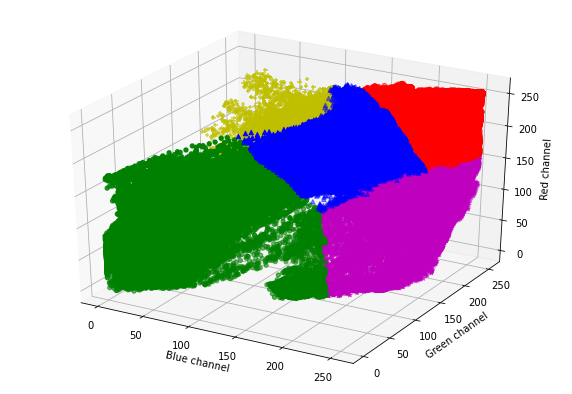

In [83]:
ind0, ind1, ind2, ind3, ind4 = [np.where(clustered == x)[0] for x in [0, 1, 2, 3, 4]]

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

plot_vals = [('r', 'o', ind0),
             ('b', '^', ind1),
             ('g', '8', ind2),
             ('m', '*', ind3),
             ('y', '+', ind4)]

for c, m, ind in plot_vals:
    xs = fpixel_matrix[ind, 0]
    ys = fpixel_matrix[ind, 1]
    zs = fpixel_matrix[ind, 2]
    ax.scatter(xs, ys, zs, c=c, marker=m)

ax.set_xlabel('Blue channel')
ax.set_ylabel('Green channel')
ax.set_zlabel('Red channel')

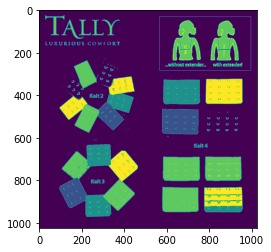

In [84]:
# simple k means clustering and application on the first image
from sklearn import cluster

kmeans = cluster.KMeans(5)
clustered = kmeans.fit_predict(pixel_matrix)

dims = np.shape(second)
clustered_img = np.reshape(clustered, (dims[0], dims[1]))
plt.imshow(clustered_img)

Text(0.5, 0, 'Red channel')

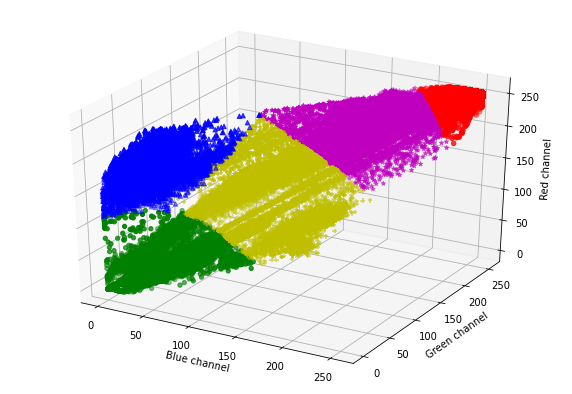

In [85]:
ind0, ind1, ind2, ind3, ind4 = [np.where(clustered == x)[0] for x in [0, 1, 2, 3, 4]]

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

plot_vals = [('r', 'o', ind0),
             ('b', '^', ind1),
             ('g', '8', ind2),
             ('m', '*', ind3),
             ('y', '+', ind4)]

for c, m, ind in plot_vals:
    xs = pixel_matrix[ind, 0]
    ys = pixel_matrix[ind, 1]
    zs = pixel_matrix[ind, 2]
    ax.scatter(xs, ys, zs, c=c, marker=m)

ax.set_xlabel('Blue channel')
ax.set_ylabel('Green channel')
ax.set_zlabel('Red channel')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



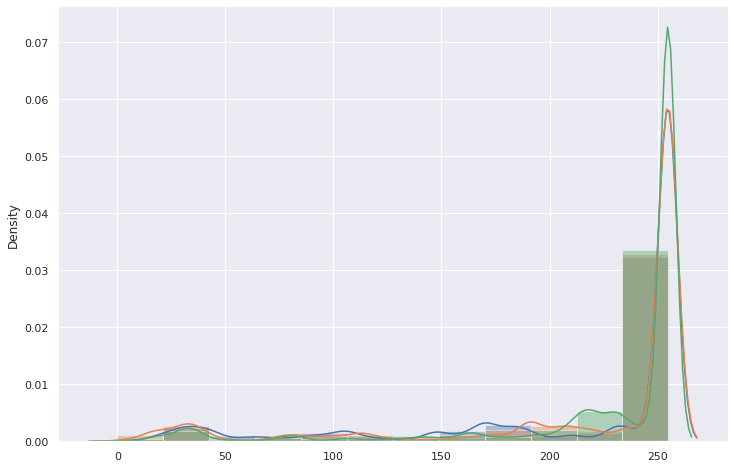

In [86]:
# quick look at color value histograms for pixel matrix from first image
import seaborn as sns
sns.set(rc={'figure.figsize':(12,8)})
sns.distplot(pixel_matrix[:,0], bins=12)
sns.distplot(pixel_matrix[:,1], bins=12)
sns.distplot(pixel_matrix[:,2], bins=12)
